# Задача

У вас имеется некоторый набор данных `marketing_campaign.csv` о покупателях супермаркета.

* ID — уникальный идентификатор клиента.
* Year_Birth — год рождения клиента.
* Dt_Customer — дата регистрации клиента на сайте.
* Recency — количество дней с момента последней покупки клиента.
* MntFruits — сумма, потраченная на фрукты за последние два года.
* MntMeatProducts — сумма, потраченная на мясо за последние два года.
* MntFishProducts — сумма, потраченная на рыбу за последние два года.
* MntSweetProducts — сумма, потраченная на сладости за последние два года.
* NumWebPurchases — количество покупок, совершённых через сайт.
* NumStorePurchases — количество покупок, совершённых непосредственно в магазинах.
* Response: 1, если клиент участвовал в последней рекламной кампании, 0 — в противном случае.

Решите задачу кластеризации покупателей, чтобы в дальнейшем планировать маркетинговые акции для каждой группы покупателей. Подготовьте результаты своей работы для демонстрации заказчику, не погружённому в машинное обучение.

In [204]:
import pandas as pd
import numpy as np
import datetime as dt 
import seaborn as sns
import urbangrammar_graphics as ugg
import matplotlib.pyplot as plt

In [143]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

# Задание 1

Загрузите датасет и выполните разведочный анализ данных. Сделайте выводы о найденных закономерностях, особенностях и других свойствах данных, которые вы обнаружите.

In [93]:
df = pd.read_csv('marketing campaign.csv')
df.head()

,ID,Year_Birth,Dt_Customer,Recency,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,NumWebPurchases,NumStorePurchases,Response
0,5524,1957,04-09-2012,58,88,546,172,88,8,4,1
1,2174,1954,08-03-2014,38,1,6,2,1,1,2,0
2,4141,1965,21-08-2013,26,49,127,111,21,8,10,0
3,6182,1984,10-02-2014,26,4,20,10,3,2,4,0
4,5324,1981,19-01-2014,94,43,118,46,27,5,6,0


In [94]:
df.shape

(2240, 11)

In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ID                 2240 non-null   int64 
 1   Year_Birth         2240 non-null   int64 
 2   Dt_Customer        2240 non-null   object
 3   Recency            2240 non-null   int64 
 4   MntFruits          2240 non-null   int64 
 5   MntMeatProducts    2240 non-null   int64 
 6   MntFishProducts    2240 non-null   int64 
 7   MntSweetProducts   2240 non-null   int64 
 8   NumWebPurchases    2240 non-null   int64 
 9   NumStorePurchases  2240 non-null   int64 
 10  Response           2240 non-null   int64 
dtypes: int64(10), object(1)
memory usage: 192.6+ KB


In [96]:
df["Dt_Customer"] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y', utc=True)

In [97]:
df["month"] = df["Dt_Customer"].dt.month
df["day"] = df["Dt_Customer"].dt.dayofweek
df["year"] = df["Dt_Customer"].dt.year

In [98]:
df.drop(['ID', 'Dt_Customer'], axis= 1 , inplace= True)

In [99]:
df.head()

,Year_Birth,Recency,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,NumWebPurchases,NumStorePurchases,Response,month,day,year
0,1957,58,88,546,172,88,8,4,1,9,1,2012
1,1954,38,1,6,2,1,1,2,0,3,5,2014
2,1965,26,49,127,111,21,8,10,0,8,2,2013
3,1984,26,4,20,10,3,2,4,0,2,0,2014
4,1981,94,43,118,46,27,5,6,0,1,6,2014


c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: U

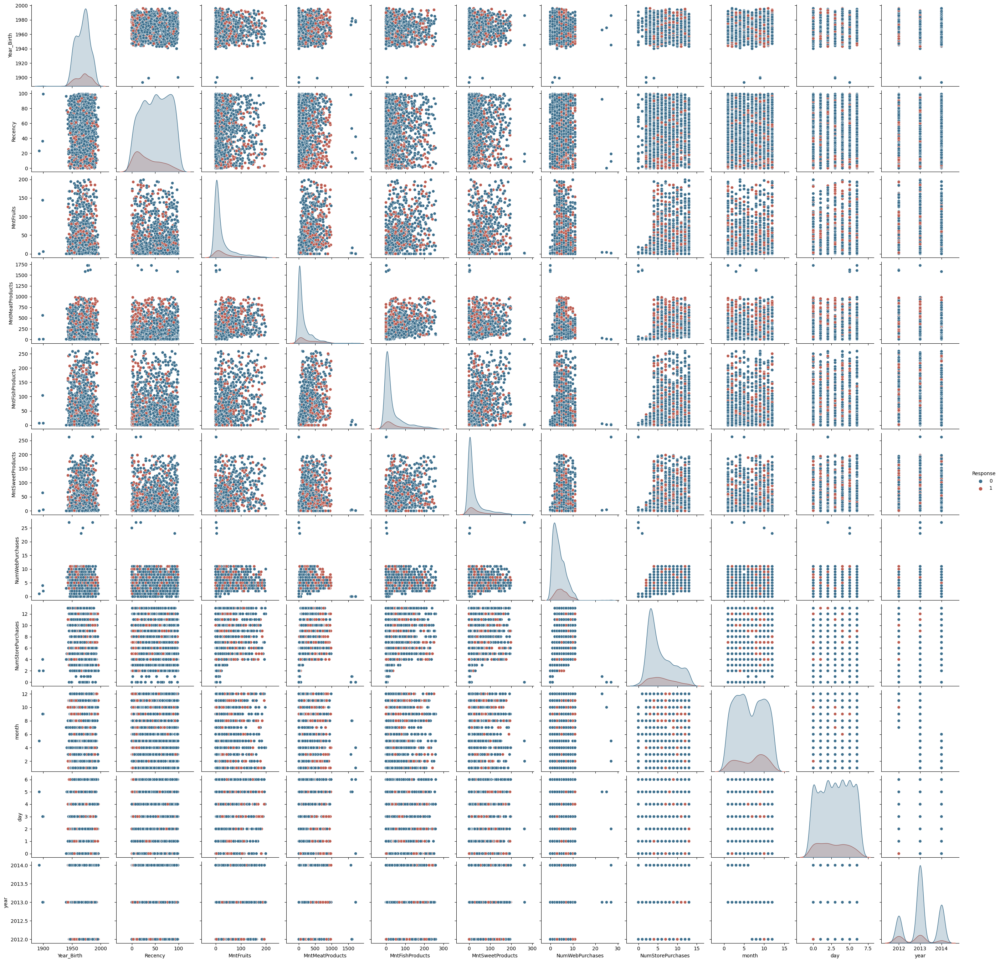

In [100]:
sns.pairplot(df, hue="Response", palette=ugg.COLORS[1:4])

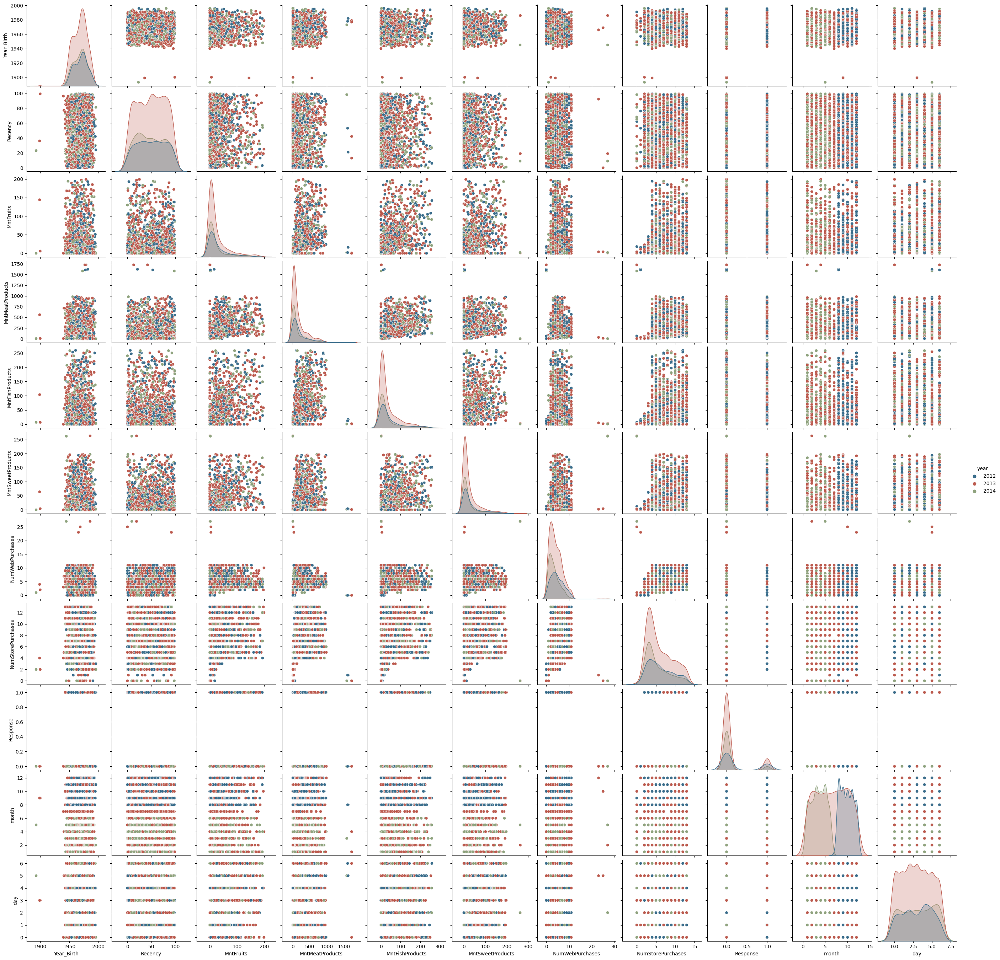

In [101]:
sns.pairplot(df, hue="year", palette=ugg.COLORS[1:4])

c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (14) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (14) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (14) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (14) and will cycle, which may produce an uninterpretable pl

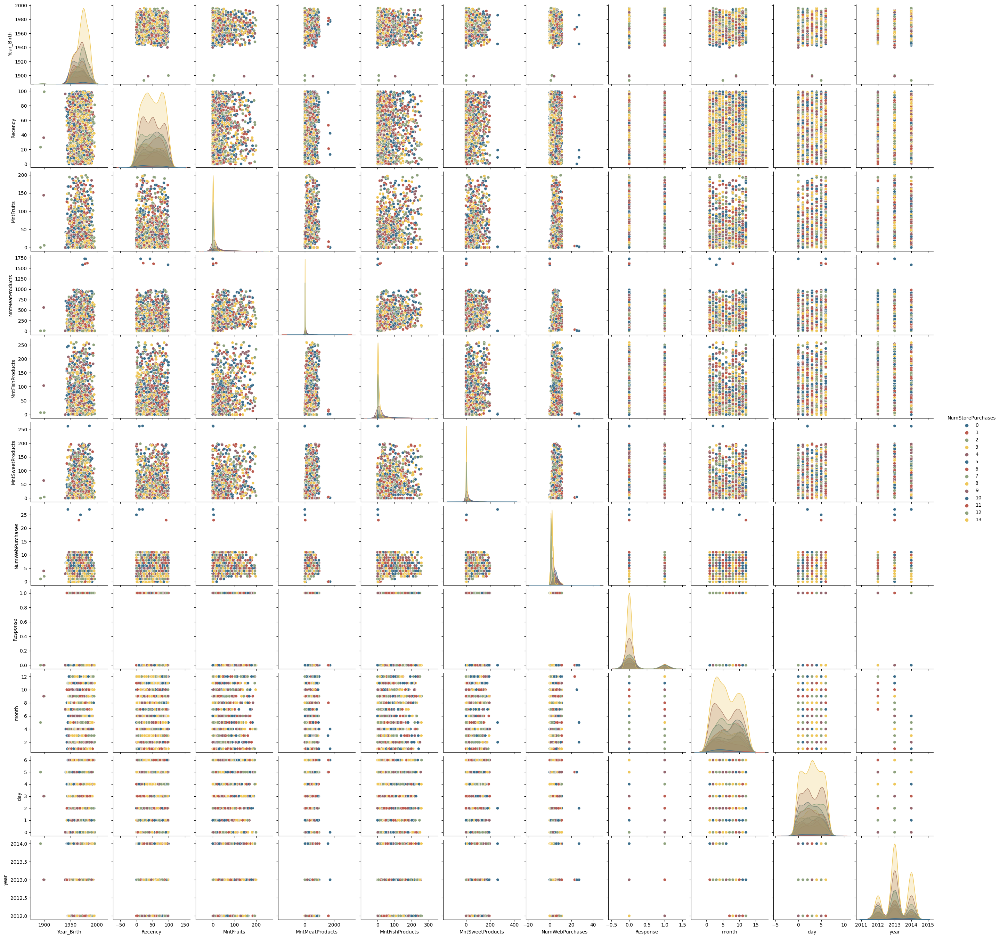

In [102]:
sns.pairplot(df, hue="NumStorePurchases", palette=ugg.COLORS[1:15])

c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (15) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (15) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (15) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: 
The palette list has fewer values (5) than needed (15) and will cycle, which may produce an uninterpretable pl

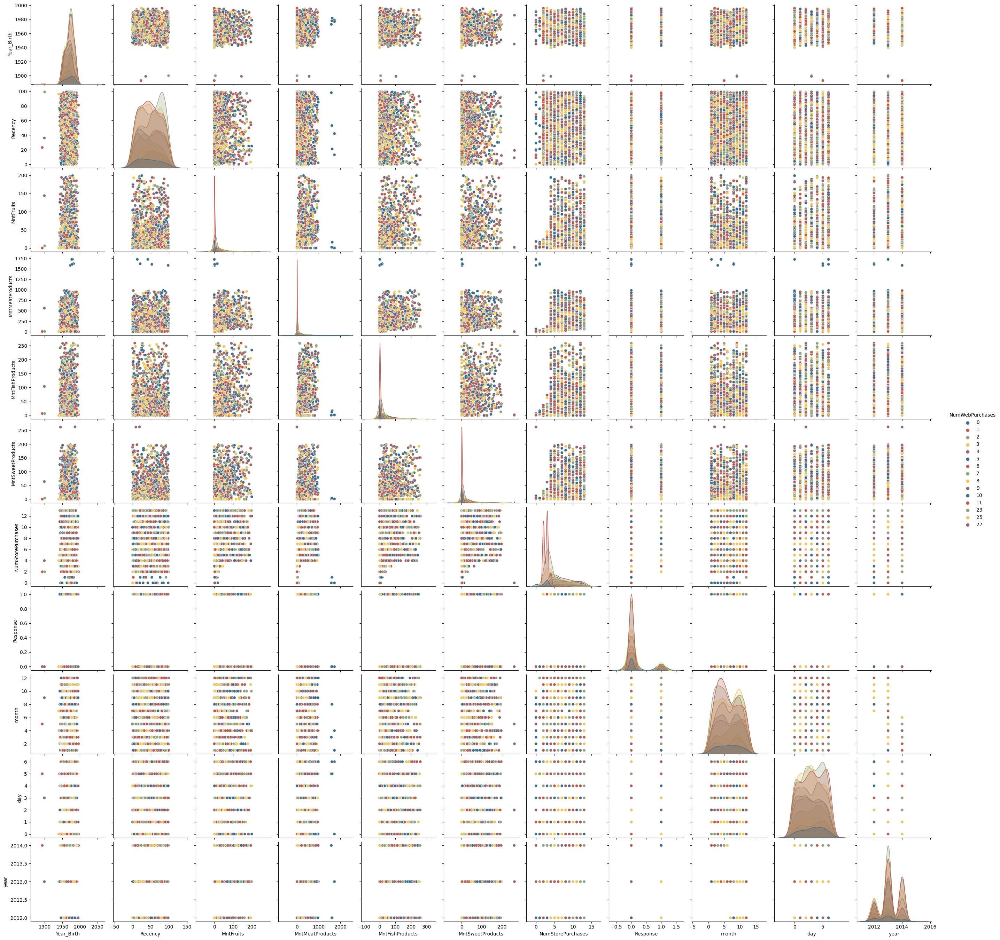

In [103]:
sns.pairplot(df, hue="NumWebPurchases", palette=ugg.COLORS[1:16])

Выводы: в данных нет пропусков, произведена работа с датой регистрации клиентов (извлечены: день, месяц и год регистрации), есть явное распределение данных по годам, дням и месяцам регистрации. Так же есть прямая зависимость между количеством покупом и суммой потраченной на покупки (что собственно логично).

# Задание 2

Метод k-средних требует явно задать количество кластеров, на которые будут разбиваться данные. Данных может быть так много, что построение одной модели будет занимать несколько часов, поэтому важно заранее примерно представлять количество кластеров до запуска обучения модели.

На основе проведённого разведочного анализа данных предположите, какое количество кластеров будет оптимальным, аргументируйте своё предположение.

Напишите ваш ответ ниже


Выводы: оптимальным на мой взгляд будет 3 кластера (есть явное распределение данных по годам регистрации клиентов).Можно так же зацепиться за 14 кластеров (количество покупок совершенных в магазинах), либо за 15 кластеров (количество покупок через сайт). 

# Задание 3

Выполните очистку и подготовку данных для дальнейшего использования при построении моделей машинного обучения. Аргументируйте выбранные шаги подготовки данных. 

Т.к. нет пропусков в данных и уже произведена работа с датой регистрации, остатется только проверить выбросы/аномалии

In [104]:
columns  = list(df.columns)

boxplot for Year_Birth


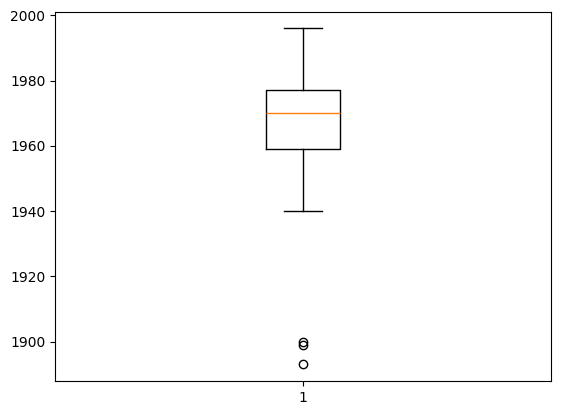

boxplot for Recency


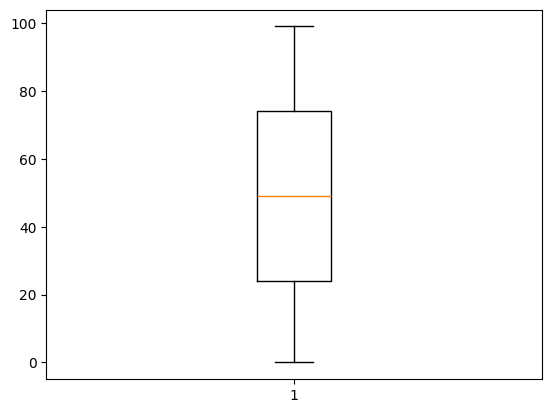

boxplot for MntFruits


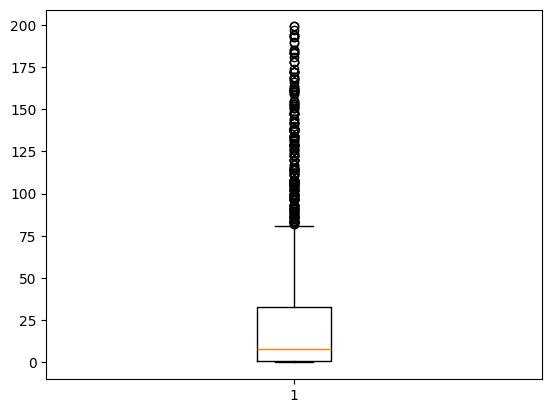

boxplot for MntMeatProducts


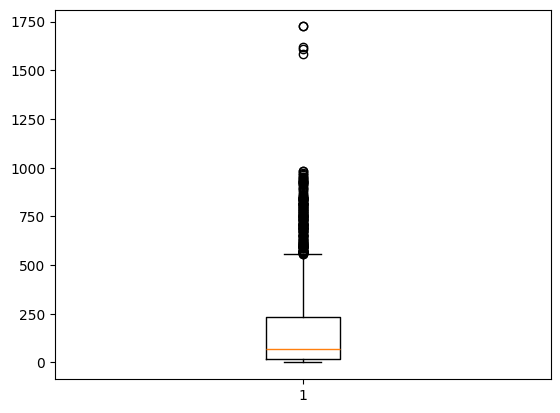

boxplot for MntFishProducts


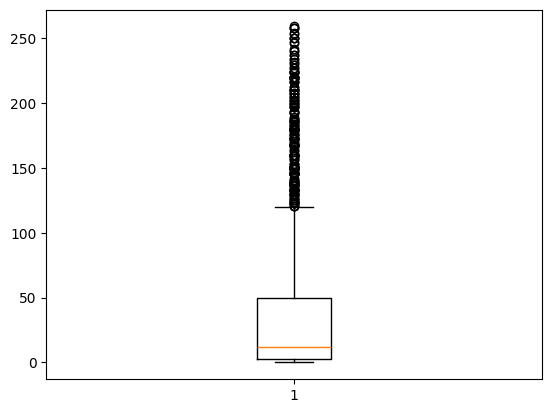

boxplot for MntSweetProducts


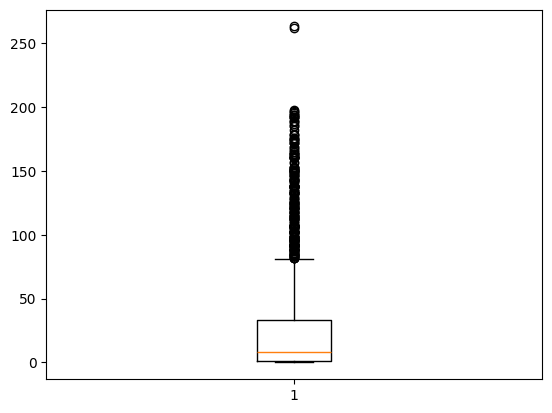

boxplot for NumWebPurchases


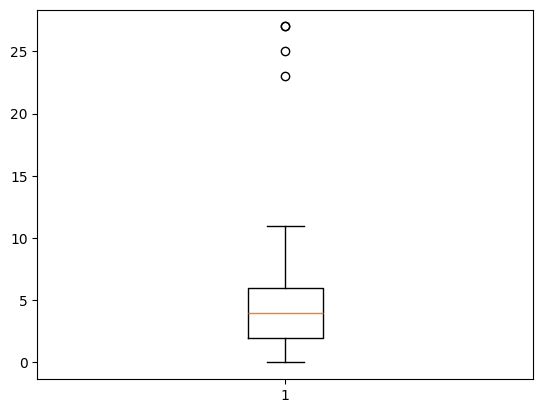

boxplot for NumStorePurchases


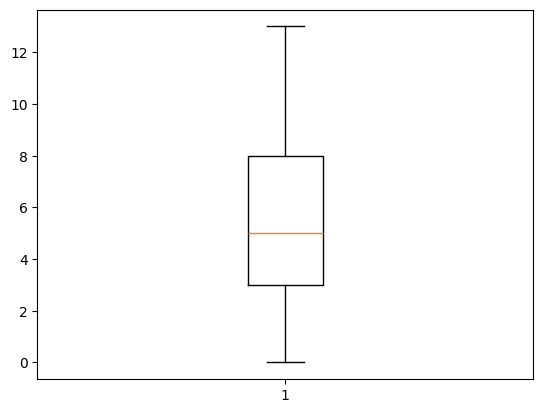

boxplot for Response


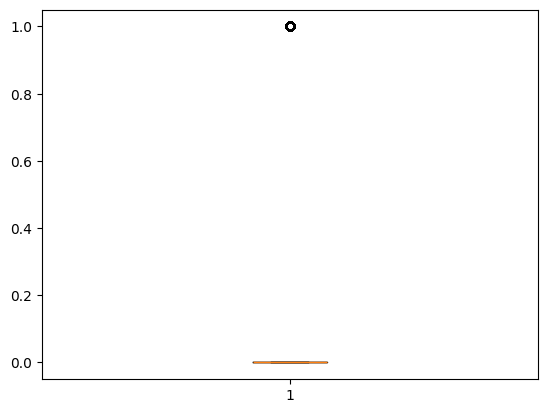

boxplot for month


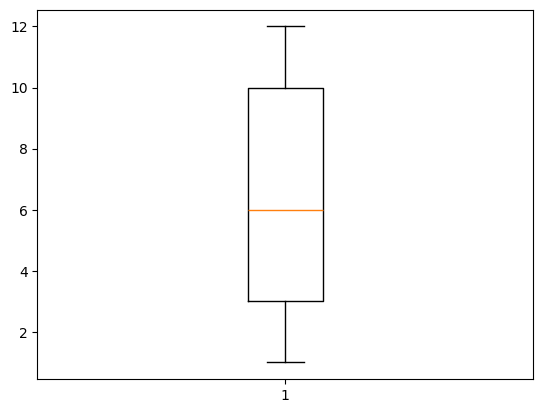

boxplot for day


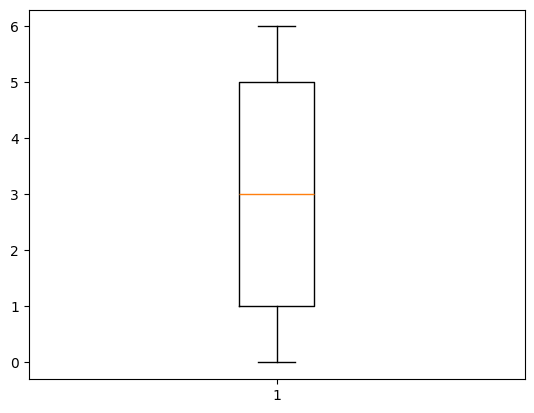

boxplot for year


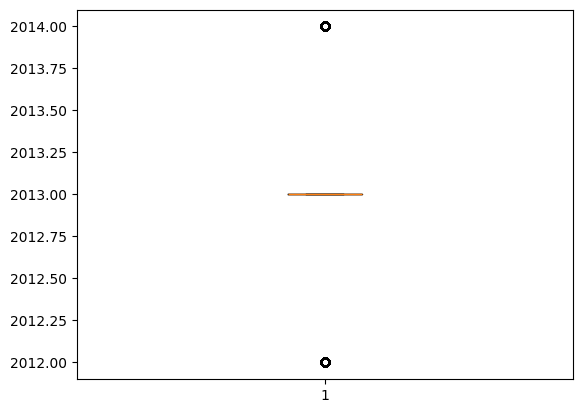

In [113]:
for col in columns:
    print(f'boxplot for {col}')
    plt.boxplot(df[col])
    plt.show()

Явных выбросов нет, есть аномалии из-за распределения данных по годам регистрации

# Задание 4

Постройте модель кластеризации с помощью метода k-средних. Определите оптимальное количество кластеров с помощью метода локтя и метрики silhouette score. 

Помните, что аналитический способ определения количества кластеров не является единственно верным. Если ваше понимание предметной области и результаты анализа данных расходятся с результатами метода локтя, вы можете выбрать и обосновать количество кластеров, исходя из своего опыта.

In [144]:
n_clusters = list(range(2, 20))
metrics = []

for k in n_clusters:
  km = KMeans(n_clusters=k).fit(df)
  score = silhouette_score(df, km.labels_)
  metrics.append(score)

c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

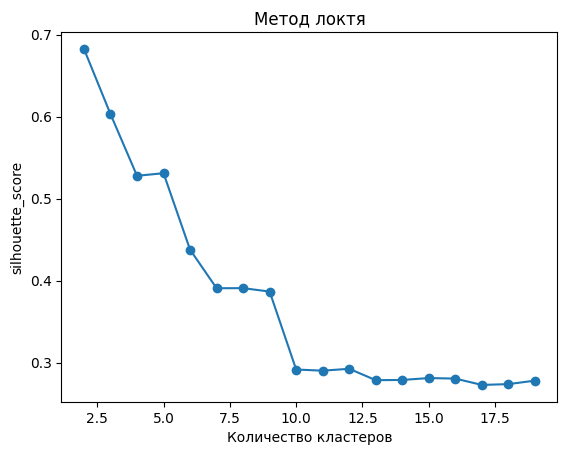

In [145]:
plt.plot(range(2, 20), metrics, marker='o')
plt.xlabel('Количество кластеров')
plt.ylabel('silhouette_score')
plt.title('Метод локтя')
plt.show()

Получили примерно 3 кластера при маесимально коэффициенте silhouette_score

# Задание 5

Визуализируйте результаты кластеризации на двумерном графике с помощью метода t-SNE. Обоснуйте выбранные значения его гиперпараметров.

In [197]:
km_2 = KMeans(n_clusters=3).fit(df)

c:\Users\krugd\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [198]:
labels = km_2.labels_

In [199]:
tsne = TSNE(n_components=2, perplexity=50)
df_emb = tsne.fit_transform(df)
data = pd.DataFrame(df_emb)
data

,0,1
0,55.041588,-7.003887
1,-46.643841,-9.991790
2,20.657698,-15.906429
3,-32.355377,-9.504501
4,11.264406,-3.169181
...,...,...
2235,17.521593,-9.751806
2236,-21.621519,8.142571
2237,25.700420,5.687620
2238,24.331493,-2.408213


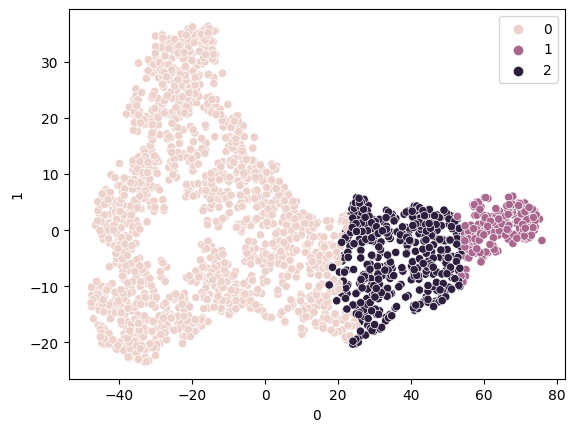

In [200]:
sns.scatterplot(x = data[0], y = data[1], hue=labels);

# Задание 6

Постройте профили кластеров и опишите их.

In [219]:
features = columns

df_g = df.groupby(labels).agg({x: ['mean', 'std'] for x in features}).T
df_g

0            1            2
Year_Birth        mean  1969.342440  1969.260000  1966.798283
                  std     11.457665    14.289273    12.448175
Recency           mean    48.955527    50.350000    49.096567
                  std     28.744671    29.504578    29.506575
MntFruits         mean    10.706480    70.525000    60.000000
                  std     19.978348    51.000240    48.490283
MntMeatProducts   mean    48.264295   734.575000   324.216738
                  std     48.371155   194.206501   101.052154
MntFishProducts   mean    14.858958    96.525000    88.763948
                  std     26.835809    66.394355    64.650691
MntSweetProducts  mean    10.861499    70.695000    63.060086
                  std     21.902370    54.262177    48.129894
NumWebPurchases   mean     3.489199     4.915000     5.740343
                  std      2.727892     1.850648     2.509158
NumStorePurchases mean     4.663914     8.195000     8.562232
                  std      2.693640     2.864963     2.889616
Response          mean     0.108005     0.380000     0.188841
                  std      0.310485     0.486604     0.391803
month             mean     6.461881     6.690000     6.390558
                  std      3.477218     3.505043     3.514308
day               mean     3.006353     2.880000     2.980687
                  std      1.991708     2.080201     1.991825
year              mean  2013.051461  2012.925000  2012.993562
                  std      0.681623     0.701309     0.683100

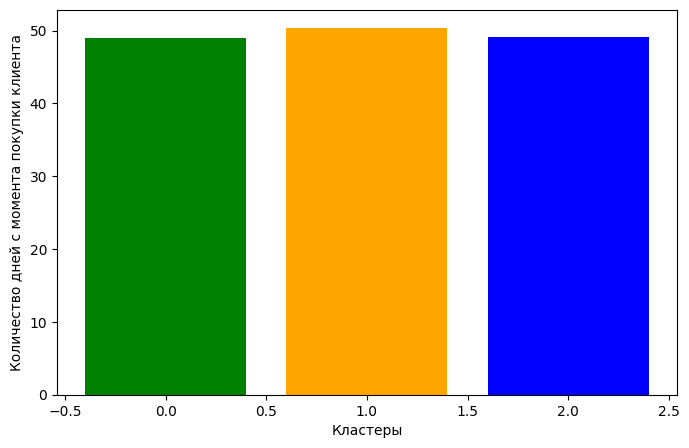

In [258]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[2], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Количество дней с момента покупки клиента')
plt.show()

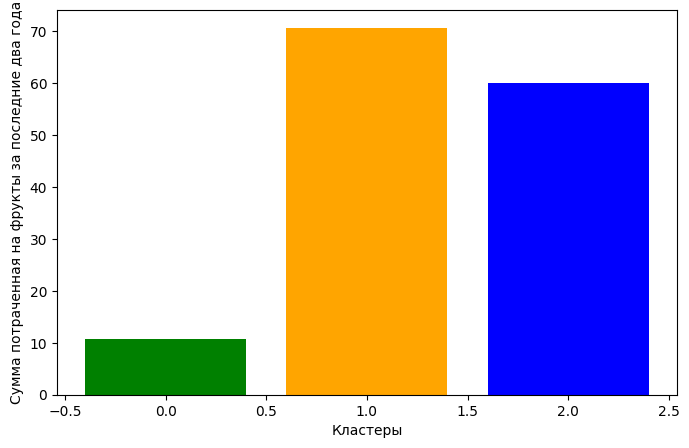

In [261]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[4], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Сумма потраченная на фрукты за последние два года')
plt.show()

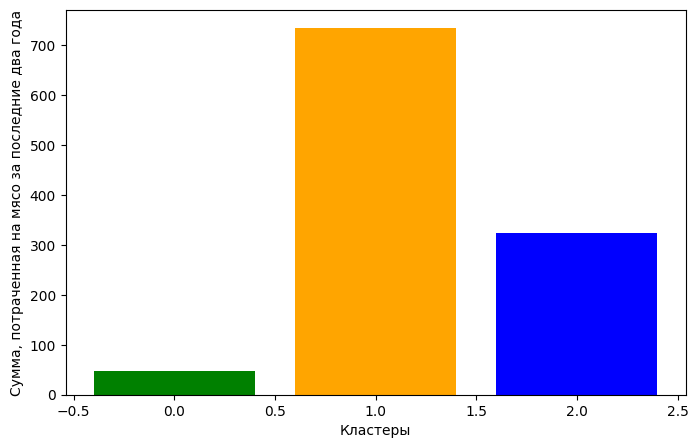

In [263]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[6], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Сумма, потраченная на мясо за последние два года')
plt.show()

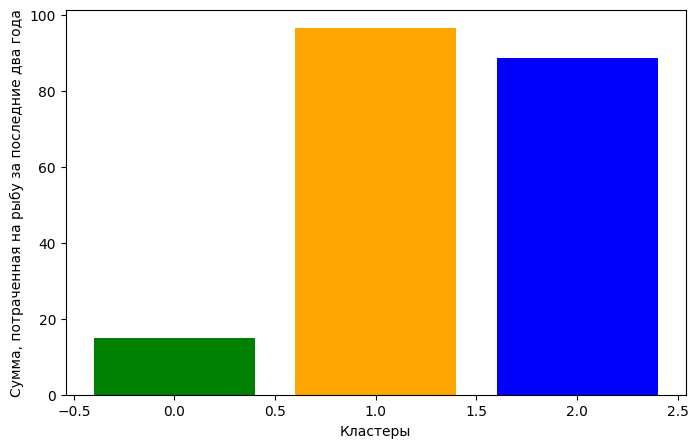

In [264]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[8], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Сумма, потраченная на рыбу за последние два года')
plt.show()

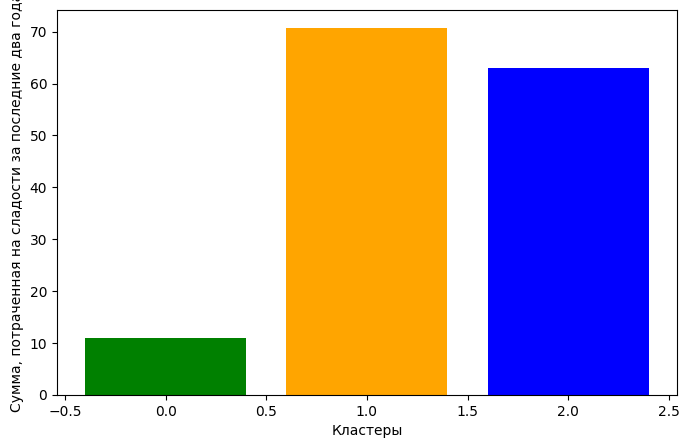

In [265]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[10], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Сумма, потраченная на сладости за последние два года')
plt.show()

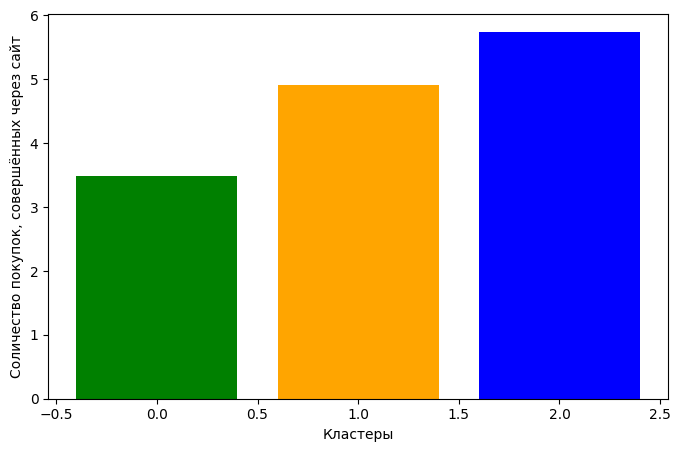

In [266]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[12], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Соличество покупок, совершённых через сайт')
plt.show()

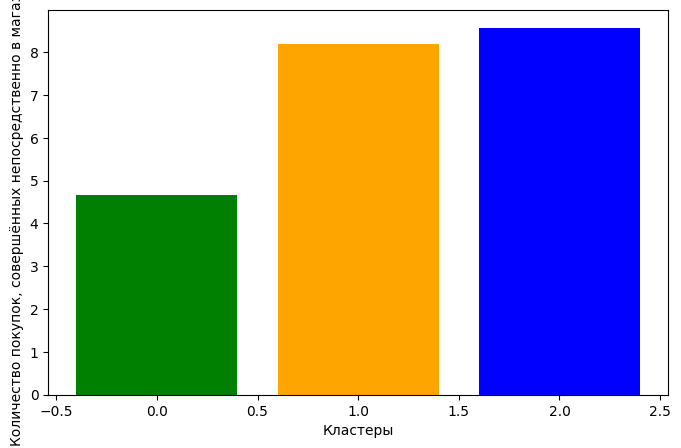

In [267]:
plt.figure(figsize=(8,5))
plt.bar(df_g.columns, df_g.iloc[14], color = ['green', 'orange', 'blue'])
plt.xlabel ('Кластеры')
plt.ylabel ('Количество покупок, совершённых непосредственно в магазинах')
plt.show()

# Задание 7

Визуализируйте профили кластеров. Подготовьте краткое резюме результатов вашего исследования для заказчика.

In [205]:
functions = ['mean', 'std']

stat = np.array([[df[feature].apply(f) for f in functions] for feature in features]).flatten()

df_g_rel = df_g.copy()
df_g_rel['Global'] = stat
df_g_rel

0            1            2       Global
Year_Birth        mean  1969.342440  1969.260000  1966.798283  1968.805804
                  std     11.457665    14.289273    12.448175    11.984069
Recency           mean    48.955527    50.350000    49.096567    49.109375
                  std     28.744671    29.504578    29.506575    28.962453
MntFruits         mean    10.706480    70.525000    60.000000    26.302232
                  std     19.978348    51.000240    48.490283    39.773434
MntMeatProducts   mean    48.264295   734.575000   324.216738   166.950000
                  std     48.371155   194.206501   101.052154   225.715373
MntFishProducts   mean    14.858958    96.525000    88.763948    37.525446
                  std     26.835809    66.394355    64.650691    54.628979
MntSweetProducts  mean    10.861499    70.695000    63.060086    27.062946
                  std     21.902370    54.262177    48.129894    41.280498
NumWebPurchases   mean     3.489199     4.915000     5.740343     4.084821
                  std      2.727892     1.850648     2.509158     2.778714
NumStorePurchases mean     4.663914     8.195000     8.562232     5.790179
                  std      2.693640     2.864963     2.889616     3.250958
Response          mean     0.108005     0.380000     0.188841     0.149107
                  std      0.310485     0.486604     0.391803     0.356274
month             mean     6.461881     6.690000     6.390558     6.467411
                  std      3.477218     3.505043     3.514308     3.486695
day               mean     3.006353     2.880000     2.980687     2.989732
                  std      1.991708     2.080201     1.991825     1.999192
year              mean  2013.051461  2012.925000  2012.993562  2013.028125
                  std      0.681623     0.701309     0.683100     0.684554

In [206]:
cluster_labels = [0, 1, 2]

for label in cluster_labels:
  df_g_rel[label] = 100 * df_g_rel[label] / df_g_rel['Global'] - 100

df_g_rel

0           1           2       Global
Year_Birth        mean   0.027257    0.023070   -0.101966  1968.805804
                  std   -4.392537   19.235564    3.872691    11.984069
Recency           mean  -0.313276    2.526249   -0.026082    49.109375
                  std   -0.751944    1.871819    1.878716    28.962453
MntFruits         mean -59.294404  168.133136  128.117521    26.302232
                  std  -49.769617   28.226898   21.916260    39.773434
MntMeatProducts   mean -71.090569  339.997005   94.199903   166.950000
                  std  -78.569845  -13.959559  -55.230274   225.715373
MntFishProducts   mean -60.402981  157.225454  136.543351    37.525446
                  std  -50.876240   21.536877   18.345047    54.628979
MntSweetProducts  mean -59.865791  161.224328  133.012640    27.062946
                  std  -46.942575   31.447486   16.592328    41.280498
NumWebPurchases   mean -14.581346   20.323497   40.528624     4.084821
                  std   -1.828971  -33.399108   -9.700748     2.778714
NumStorePurchases mean -19.451299   41.532768   47.875090     5.790179
                  std  -17.143197  -11.873262  -11.114934     3.250958
Response          mean -27.565454  154.850299   26.647992     0.149107
                  std  -12.851952   36.581688    9.972520     0.356274
month             mean  -0.085508    3.441706   -1.188308     6.467411
                  std   -0.271814    0.526223    0.791953     3.486695
day               mean   0.555939   -3.670300   -0.302550     2.989732
                  std   -0.374332    4.052094   -0.368476     1.999192
year              mean   0.001159   -0.005123   -0.001717  2013.028125
                  std   -0.428192    2.447516   -0.212499     0.684554

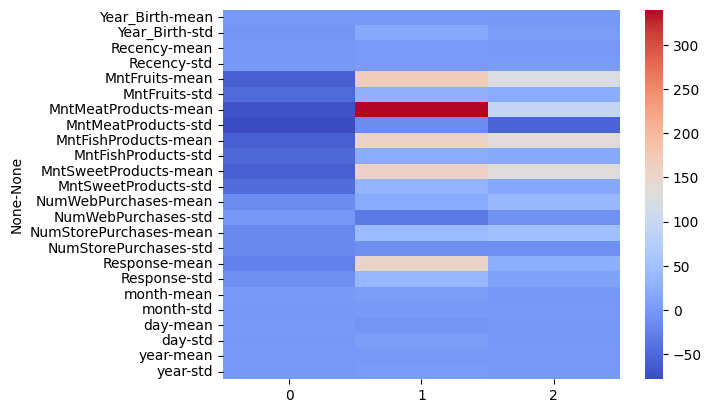

In [269]:
sns.heatmap(df_g_rel[cluster_labels], cmap='coolwarm');

1) Точки в кластерах распределены примерно равномерно, следователдьно нет каких-либо аномальных покупателей.
2) Покупатели в кластере 1 потратили больше всего денег на мясо за последние 2 года. (Примерно на 300%)
3) Больше всего тратили деньги покупатели в кластере 1 (наиболее активные пользователи в плане покупок).
4) Покупатели из кластера 2 потратили столько же денег, как и все покупатели в среднем. 
5) Покупатели из кластера 0 потратили меньше, чем все покупатели в среднем.

Покупатели из кластера 1 - "главные" покупатели, они тратят больше всего денег (идеальная цель для компании максимизации)